# Detección de Objetos con RT-DETR

**Univ:** Romero Morales Jhojan Erick

**Modelo:** RT-DETR  

**Link modelo:** https://github.com/lyuwenyu/RT-DETR  

**Link modelo usado:** https://huggingface.co/PekingU/rtdetr_r50vd 

**Dataset:** Office room Object Detection

**Link dataset:** https://universe.roboflow.com/office-room/office-room-iq0zz

Este cuadernillo es una adaptación del original `04_cv_detection.ipynb`. En lugar de utilizar Faster R-CNN, implementamos el modelo de detección de objetos de una etapa **RT-DETR** (Real-Time DEtection TRansformer), el cual es un modelo reciente y altamente eficiente
Además, se utiliza el dataset **Office room** para probar el modelo (inferencia) sin realizar entrenamiento, probando así su capacidad de generalización en un conjunto de datos no empleado en su aprendizaje base

In [1]:
# Instalar transformers y timm
# %pip install transformers timm
#%pip install roboflow

## Cargar el Dataset

Este código está preparado para leer cualquier dataset en formato **Pascal VOC (XML)**. 
Este formato es ideal porque herramientas como **Roboflow** y **LabelMe** permiten exportar tus anotaciones manuales directamente en formato Pascal VOC. 

Solo necesitas asegurarte de tener dos carpetas:
* `JPEGImages/`: Donde van tus imágenes.
* `Annotations/`: Donde van tus archivos `.xml` generados por Roboflow o LabelMe.

In [2]:
import os
import xml.etree.ElementTree as ET
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import matplotlib.patheffects as PathEffects
from PIL import Image
import numpy as np
import random
import torch

device = "cuda" if torch.cuda.is_available() else "cpu"
print(device)

cuda


In [3]:
dataset_dir = "./Office_room.v1i.voc/train"
images_dir = dataset_dir
annotations_dir = dataset_dir

os.makedirs(images_dir, exist_ok=True)
os.makedirs(annotations_dir, exist_ok=True)

image_files = [f for f in os.listdir(images_dir) if f.endswith(('.jpg', '.jpeg', '.png'))]
if len(image_files) == 0:
    print("Aún no hay imágenes. Guarda tus imágenes en JPEGImages y tus xml en Annotations.")
else:
    print(f"Total de imágenes encontradas: {len(image_files)}")

Total de imágenes encontradas: 880


In [4]:
dataset_classes = ["background"] # Clases dinámicas

def get_sample_custom(image_name):
    img_path = os.path.join(images_dir, image_name)
    # Busca el XML correspondiente (soporta .jpg, .jpeg, .png)
    xml_name = os.path.splitext(image_name)[0] + '.xml'
    ann_path = os.path.join(annotations_dir, xml_name)
    
    img = Image.open(img_path).convert("RGB")
    
    labels = []
    bbs = []
    
    if os.path.exists(ann_path):
        # Leer anotaciones XML
        tree = ET.parse(ann_path)
        root = tree.getroot()
        
        for obj in root.findall('object'):
            name = obj.find('name').text
            if name not in dataset_classes:
                dataset_classes.append(name)
            labels.append(dataset_classes.index(name))
            
            bndbox = obj.find('bndbox')
            xmin = int(float(bndbox.find('xmin').text))
            ymin = int(float(bndbox.find('ymin').text))
            xmax = int(float(bndbox.find('xmax').text))
            ymax = int(float(bndbox.find('ymax').text))
            bbs.append([xmin, ymin, xmax - xmin, ymax - ymin])
            
    return img, (labels, bbs)

def plot_anns(img, anns, classes=dataset_classes, ax=None):
    if not ax:
        fig, ax = plt.subplots(figsize=(10, 6))
    ax.imshow(img)
    labels, bbs = anns
    for lab, bb in zip(labels, bbs):
        x, y, w, h = bb
        rect = mpatches.Rectangle((x, y), w, h, fill=False, edgecolor='red', linewidth=2)
        
        # Evitar error si lab es mayor a la longitud de classes (pasa con inferencia RT-DETR vs GT)
        class_name = classes[lab] if lab < len(classes) else str(lab)
        
        text = ax.text(x, y - 10, class_name, {'color': 'red'})
        text.set_path_effects([PathEffects.withStroke(linewidth=5, foreground='w')])
        ax.add_patch(rect)

In [5]:
random_img = random.choice(image_files)
img, anns = get_sample_custom(random_img)
print(img.size)
print("--"*20)
print(anns)

(1500, 1000)
----------------------------------------
([1, 2, 3], [[640, 225, 408, 611], [5, 469, 697, 532], [1, 618, 1500, 378]])


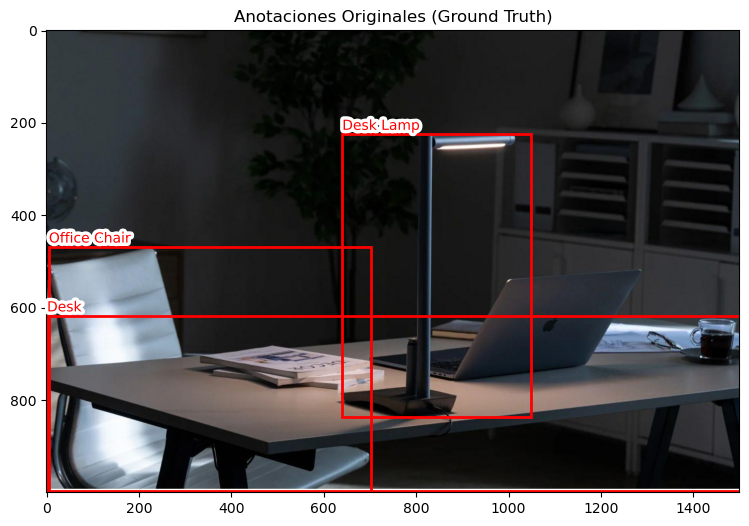

In [6]:
plot_anns(img, anns)
plt.title("Anotaciones Originales (Ground Truth)")
plt.show()

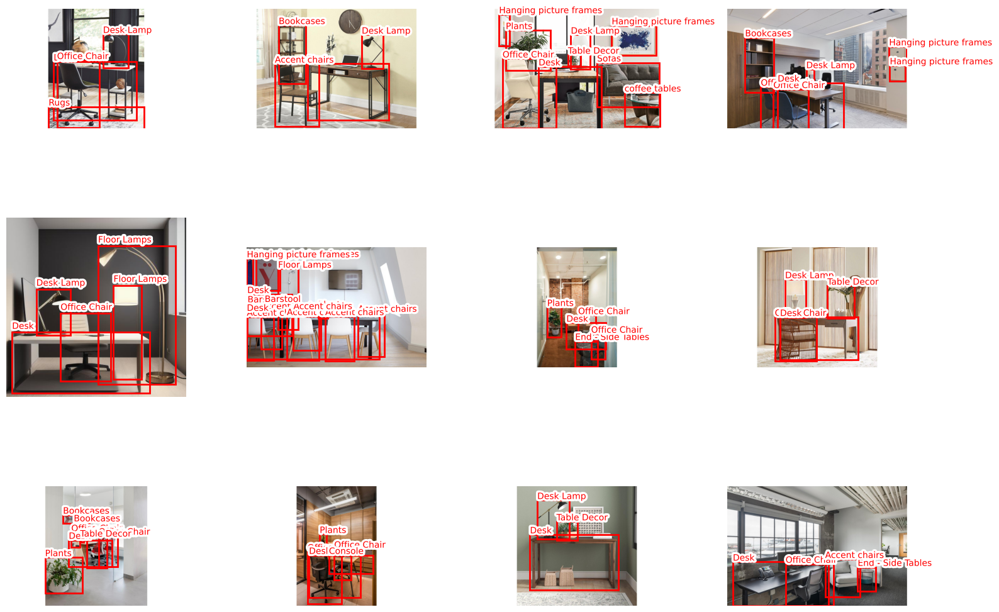

In [7]:
r, c = 3, 4
fig = plt.figure(figsize=(4*c, 4*r))
for _r in range(r):
    for _c in range(c):
        ax = plt.subplot(r, c, _r*c + _c + 1)
        ix = random.randint(0, len(image_files)-1)
        img, anns = get_sample_custom(image_files[ix])
        plot_anns(img, anns, ax=ax)
        plt.axis("off")
plt.tight_layout()
plt.show()

## Cargar el modelo RT-DETR y ver su Arquitectura

Utilizaremos el modelo pre-entrenado `PekingU/rtdetr_r50vd` disponible en HuggingFace Hub.
Este es un modelo basado en Transformers para la detección de objetos en tiempo real.

Al imprimir el modelo, veremos su **arquitectura interna**, compuesta principalmente por:
1. **Backbone**: ResNet-50vd (extrae características de la imagen).
2. **Encoder**: Transformer Encoder (procesa las características multiescala).
3. **Decoder**: Transformer Decoder (usa *object queries* para predecir las cajas y clases).

In [8]:
from transformers import RTDetrForObjectDetection, RTDetrImageProcessor


processor = RTDetrImageProcessor.from_pretrained("PekingU/rtdetr_r50vd")
model = RTDetrForObjectDetection.from_pretrained("PekingU/rtdetr_r50vd").to(device)

model

d:\quinto_semestre\anaconda\envs\conda_GPU\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
Loading weights: 100%|██████████| 764/764 [00:00<00:00, 4383.12it/s]


RTDetrForObjectDetection(
  (model): RTDetrModel(
    (backbone): RTDetrConvEncoder(
      (model): RTDetrResNetBackbone(
        (embedder): RTDetrResNetEmbeddings(
          (embedder): Sequential(
            (0): RTDetrResNetConvLayer(
              (convolution): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
              (normalization): RTDetrFrozenBatchNorm2d()
              (activation): ReLU()
            )
            (1): RTDetrResNetConvLayer(
              (convolution): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
              (normalization): RTDetrFrozenBatchNorm2d()
              (activation): ReLU()
            )
            (2): RTDetrResNetConvLayer(
              (convolution): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
              (normalization): RTDetrFrozenBatchNorm2d()
              (activation): ReLU()
            )
          )
          (pooler): MaxPool2d(

## Inferencia sobre el Dataset de Objetos de Oficina\n

**Nota Importante sobre las Etiquetas:**

Como la instrucción fue **"probar, no entrenar"**, estamos usando el modelo RT-DETR tal cual fue pre-entrenado en el dataset **COCO** (el cual tiene 80 clases como 'persona', 'manzana', 'taza', 'laptop', 'mouse', 'keyboard', etc.). Al igual que en el cuadernillo original `04_cv_detection.ipynb`, el modelo tratará de identificar los objetos de nuestro dataset de oficina emparejándolos con las clases que ya conoce

A continuación probaremos el modelo sobre algunas imágenes del dataset de objetos de oficina.

In [9]:
def predict(image, threshold=0.2):
    # Procesar imagen para el modelo
    inputs = processor(images=image, return_tensors="pt").to(device)
    
    # Predicción
    model.eval()
    with torch.no_grad():
        outputs = model(**inputs)
        
    # Post-procesar salidas para obtener cajas
    target_sizes = torch.tensor([image.size[::-1]])
    results = processor.post_process_object_detection(outputs, target_sizes=target_sizes, threshold=threshold)[0]
    
    # Extraer cajas y etiquetas
    pred_labels = results["labels"].cpu().tolist()
    pred_scores = results["scores"].cpu().tolist()
    pred_boxes = results["boxes"].cpu().tolist() # formato [xmin, ymin, xmax, ymax]
    
    # Convertir a formato [xmin, ymin, w, h] para graficar
    bbs = []
    for box in pred_boxes:
        xmin, ymin, xmax, ymax = box
        bbs.append([xmin, ymin, xmax - xmin, ymax - ymin])
        
    # Mapeo de etiquetas a nombres de clase
    coco_classes = model.config.id2label
    
    # Generar array de clases detectadas para plot_anns
    classes_names = [f"{coco_classes[label]} ({score:.2f})" for label, score in zip(pred_labels, pred_scores)]
    
    return classes_names, bbs

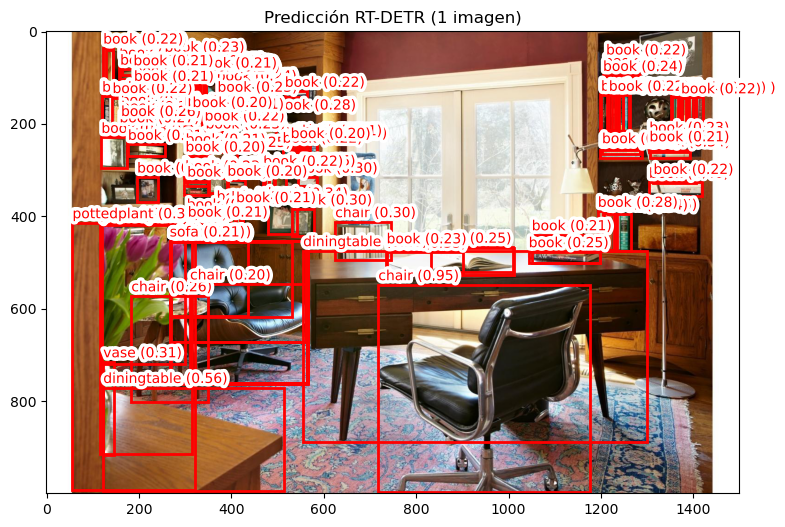

In [10]:
img_path = os.path.join(images_dir, random.choice(image_files))
image = Image.open(img_path).convert("RGB")
classes_names, bbs = predict(image, threshold=0.2)

fig, ax = plt.subplots(figsize=(10, 6))
plot_anns(image, (list(range(len(classes_names))), bbs), classes=classes_names, ax=ax)
plt.title("Predicción RT-DETR (1 imagen)")
plt.show()

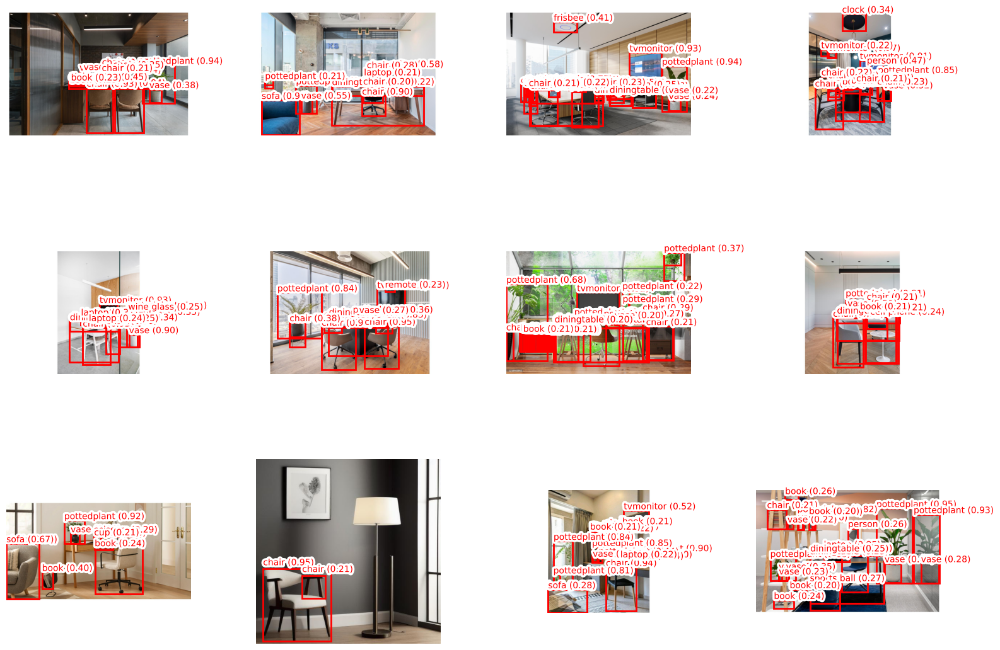

In [11]:
r, c = 3, 4
fig = plt.figure(figsize=(4*c, 4*r))
for _r in range(r):
    for _c in range(c):
        ax = plt.subplot(r, c, _r*c + _c + 1)
        ix = random.randint(0, len(image_files)-1)
        img_path = os.path.join(images_dir, image_files[ix])
        image = Image.open(img_path).convert("RGB")
        
        classes_names, bbs = predict(image, threshold=0.2)
        plot_anns(image, (list(range(len(classes_names))), bbs), classes=classes_names, ax=ax)
        plt.axis("off")
plt.tight_layout()
plt.show()


Hemos adaptado el notebook original para utilizar **RT-DETR**, un detector de una etapa basado en Transformers, en lugar de Faster R-CNN

## Imagenes etiquetadas con Roboflow
En esta fase, debes subir fotos propias a Roboflow, etiquetarlas con cajas delimitadoras y exportar el dataset en formato **Pascal VOC**
Extrae las imagenes descargadas en la carpeta correspondiente para que el modelo pueda inferir sobre ellas

In [12]:
roboflow_dir = "./RoboFlow-Office-Dataset.voc/train"

os.makedirs(roboflow_dir, exist_ok=True)

rf_image_files = [f for f in os.listdir(roboflow_dir) if f.endswith(('.jpg', '.jpeg', '.png'))]

print(f"✓ Imágenes encontradas: {len(rf_image_files)}")
print(f"✓ Directorio de Roboflow: {roboflow_dir}")

✓ Imágenes encontradas: 101
✓ Directorio de Roboflow: ./RoboFlow-Office-Dataset.voc/train


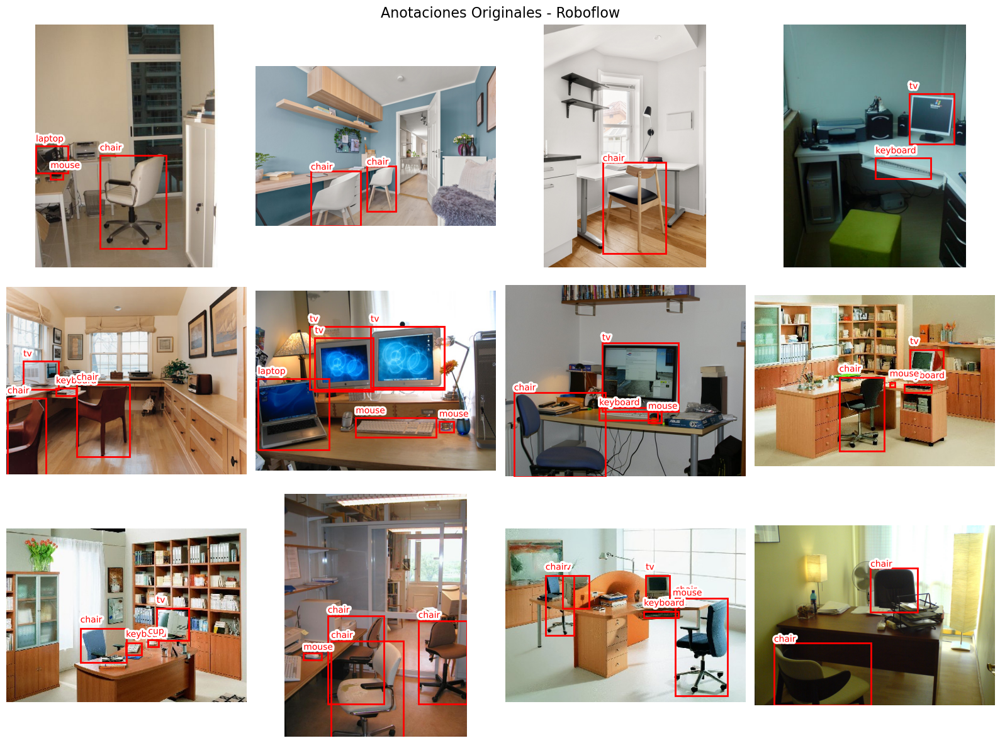

In [13]:

if len(rf_image_files) > 0:
    r, c = 3, 4
    fig = plt.figure(figsize=(4*c, 4*r))
    for _r in range(r):
        for _c in range(c):
            ax = plt.subplot(r, c, _r*c + _c + 1)
            if _r*c + _c + 1 <= len(rf_image_files):
                ix = _r*c + _c
                img_path = os.path.join(roboflow_dir, rf_image_files[ix])
                image = Image.open(img_path).convert("RGB")
                
                xml_name = os.path.splitext(rf_image_files[ix])[0] + '.xml'
                xml_path = os.path.join(roboflow_dir, xml_name)
                
                labels = []
                bbs = []
                if os.path.exists(xml_path):
                    tree = ET.parse(xml_path)
                    root = tree.getroot()
                    for obj in root.findall('object'):
                        name = obj.find('name').text
                        labels.append(name)
                        bndbox = obj.find('bndbox')
                        xmin = int(float(bndbox.find('xmin').text))
                        ymin = int(float(bndbox.find('ymin').text))
                        xmax = int(float(bndbox.find('xmax').text))
                        ymax = int(float(bndbox.find('ymax').text))
                        bbs.append([xmin, ymin, xmax - xmin, ymax - ymin])
                
                plot_anns(image, (list(range(len(labels))), bbs), classes=labels, ax=ax)
            plt.axis("off")
    plt.suptitle("Anotaciones Originales - Roboflow", fontsize=16)
    plt.tight_layout()
    plt.show()

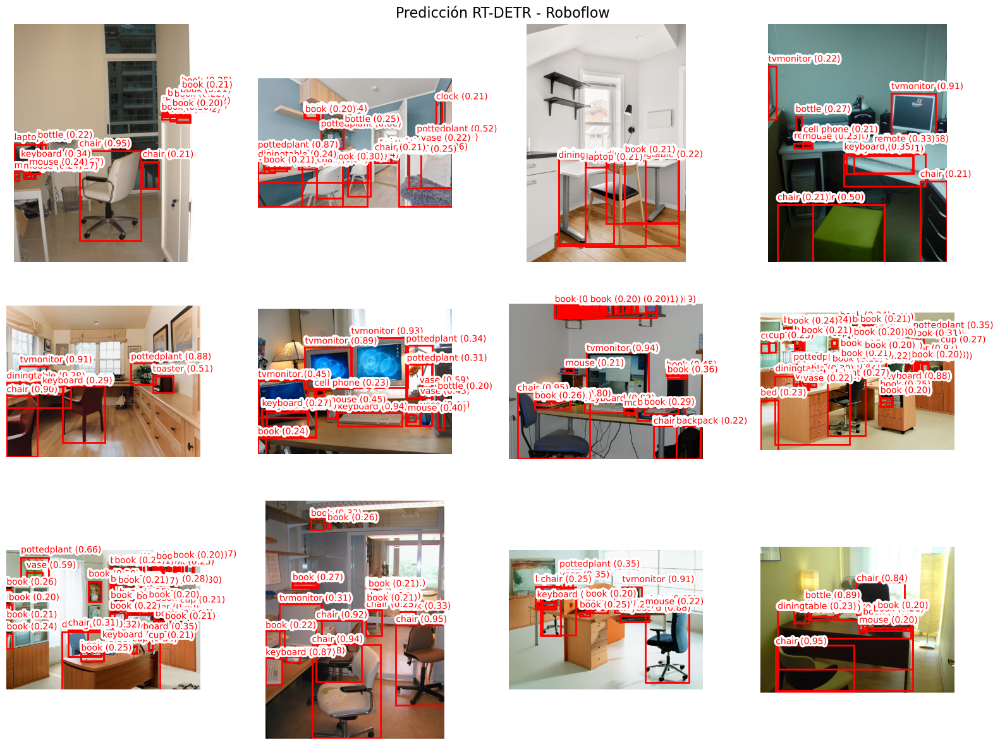

In [14]:
if len(rf_image_files) > 0:
    r, c = 3, 4
    fig = plt.figure(figsize=(4*c, 4*r))
    for _r in range(r):
        for _c in range(c):
            ax = plt.subplot(r, c, _r*c + _c + 1)
            if _r*c + _c + 1 <= len(rf_image_files):
                ix = _r*c + _c
                img_path = os.path.join(roboflow_dir, rf_image_files[ix])
                image = Image.open(img_path).convert("RGB")
                
                classes_names, bbs = predict(image, threshold=0.2)
                plot_anns(image, (list(range(len(classes_names))), bbs), classes=classes_names, ax=ax)
            plt.axis("off")
    plt.suptitle("Predicción RT-DETR - Roboflow", fontsize=16)
    plt.tight_layout()
    plt.show()


## Imagenes etiquetadas con LabelMe
En esta última fase, utilizaremos **LabelMe**. Con LabelMe dibujas bounding boxes de forma local. Guarda las imágenes y sus archivos `.json`

In [15]:
import json

labelme_dir = "./LabelMe_Office_Dataset"
os.makedirs(labelme_dir, exist_ok=True)

lm_image_files = [f for f in os.listdir(labelme_dir) if f.endswith(('.jpg', '.jpeg', '.png'))]

print(f"✓ Imágenes LabelMe encontradas: {len(lm_image_files)}")
print(f"✓ Directorio: {labelme_dir}")

✓ Imágenes LabelMe encontradas: 104
✓ Directorio: ./LabelMe_Office_Dataset


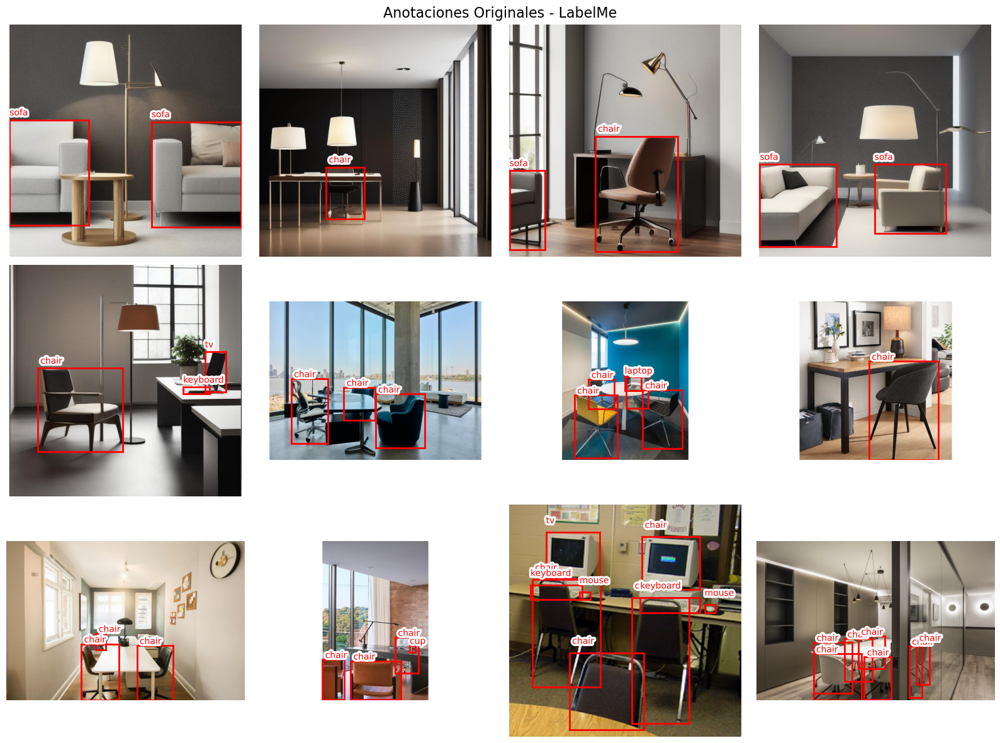

In [16]:

def get_labelme_sample(image_name, labelme_dir):
    img_path = os.path.join(labelme_dir, image_name)
    json_name = os.path.splitext(image_name)[0] + '.json'
    json_path = os.path.join(labelme_dir, json_name)
    
    img = Image.open(img_path).convert("RGB")
    
    labels = []
    bbs = []
    
    if os.path.exists(json_path):
        try:
            with open(json_path) as f:
                data = json.load(f)
                for shape in data.get('shapes', []):
                    label = shape.get('label', 'unknown')
                    labels.append(label)
                    
                    points = shape.get('points', [])
                    if len(points) >= 2:
                        x_coords = [p[0] for p in points]
                        y_coords = [p[1] for p in points]
                        xmin = int(min(x_coords))
                        ymin = int(min(y_coords))
                        xmax = int(max(x_coords))
                        ymax = int(max(y_coords))
                        bbs.append([xmin, ymin, xmax - xmin, ymax - ymin])
        except Exception as e:
            print(f"Error al leer {json_name}: {e}")
    
    return img, (labels, bbs)

if len(lm_image_files) > 0:
    r, c = 3, 4
    fig = plt.figure(figsize=(4*c, 4*r))
    for _r in range(r):
        for _c in range(c):
            ax = plt.subplot(r, c, _r*c + _c + 1)
            if _r*c + _c + 1 <= len(lm_image_files):
                ix = _r*c + _c
                image, anns = get_labelme_sample(lm_image_files[ix], labelme_dir)
                labels, bbs = anns
                plot_anns(image, (list(range(len(labels))), bbs), classes=labels, ax=ax)
            plt.axis("off")
    plt.suptitle("Anotaciones Originales - LabelMe", fontsize=16)
    plt.tight_layout()
    plt.show()

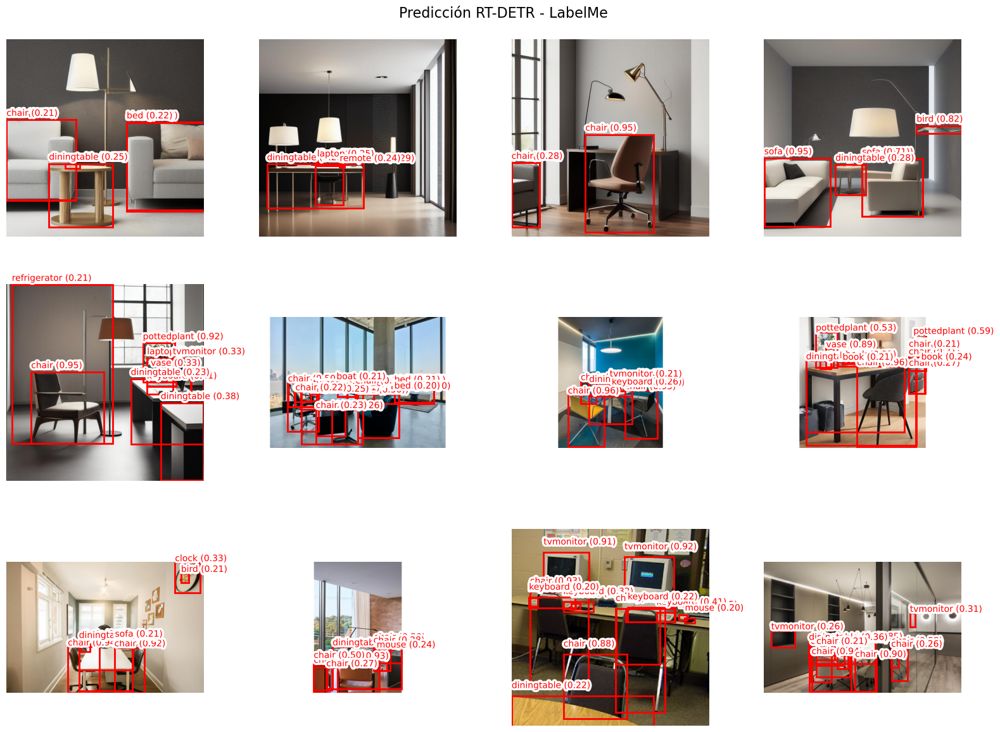

In [17]:
if len(lm_image_files) > 0:
    r, c = 3, 4
    fig = plt.figure(figsize=(4*c, 4*r))
    for _r in range(r):
        for _c in range(c):
            ax = plt.subplot(r, c, _r*c + _c + 1)
            if _r*c + _c + 1 <= len(lm_image_files):
                ix = _r*c + _c
                img_path = os.path.join(labelme_dir, lm_image_files[ix])
                image = Image.open(img_path).convert("RGB")
                
                classes_names, bbs = predict(image, threshold=0.2)
                plot_anns(image, (list(range(len(classes_names))), bbs), classes=classes_names, ax=ax)
            plt.axis("off")
    plt.suptitle("Predicción RT-DETR - LabelMe", fontsize=16)
    plt.tight_layout()
    plt.show()